In [1]:
"""
RED ECOLOGICA POLINIZADORES - PLANTAS 
Diego Becerril 
"""

'\nRED ECOLOGICA POLINIZADORES - PLANTAS \nDiego Becerril \n'

In [2]:
#============================================================
# Instalamos la biblioteca para leer documentos de excel. 
#============================================================
!pip install openpyxl

In [3]:
#=======================================================================================================================
# Instalamos la biblioteca de biopython para poder trabajar con herramientas del ncbi y calculos de modularidad
#========================================================================================================================
!pip install biopython

In [4]:
# =============================================================================
# Configuracion inicial e instalacion de librerias necesarias. 
# =============================================================================

import pandas as pd
import networkx as nx
import numpy as np
import os
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import KDTree
import warnings

# Configuración general de la grafica. 
warnings.filterwarnings('ignore')
sns.set_theme(style="whitegrid", font_scale=1.2)
plt.rcParams.update({
    'figure.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.titlepad': 20,
    'font.family': 'DejaVu Sans'
})

In [5]:
#========================================================
# Se lee el archivo en formato txt de los polinizadores 
#========================================================
archivo_txt = r"C:\Users\diego\Documents\VIU\Tesina datos\POLLINATORS\occurrence.txt"

df = pd.read_csv(archivo_txt, delimiter='\t', low_memory=False)
#======================================
# Se guarda el archivo de excel
#======================================
archivo_xlsx = r"C:\Users\diego\Documents\VIU\Tesina datos\occurrence_polinizadores.xlsx"
df.to_excel(archivo_xlsx, index=False)

In [6]:
#======================================================
# Se lee el archivo en formato txt de las plantas 
#======================================================
archivo_txt = r"C:\Users\diego\Documents\VIU\Tesina datos\PLANTAE\occurrence.txt"

df = pd.read_csv(archivo_txt, delimiter='\t', low_memory=False)

#===========================================
# Se guarda el archivo de excel
#===========================================
archivo_xlsx = r"C:\Users\diego\Documents\VIU\Tesina datos\occurrence_plantas.xlsx"
df.to_excel(archivo_xlsx, index=False)

In [7]:
# =============================================================================
# Se cargan y  se preparan los datos
# =============================================================================

def cargar_datos():
    """Carga los datos de polinizadores y plantas desde los de archivos Excel."""
    try:
        # Cargamos los polinizadores 
        polinizadores = pd.read_excel(
            r'C:\Users\diego\Documents\VIU\Tesina datos\occurrence_polinizadores.xlsx',
            usecols=['scientificName', 'decimalLatitude', 'decimalLongitude', 'year', 'month', 'day'],
            dtype={'year': 'float', 'month': 'float', 'day': 'float'}
        )
        
        # Cargaramos las plantas
        plantas = pd.read_excel(
            r'C:\Users\diego\Documents\VIU\Tesina datos\occurrence_plantas.xlsx',
            usecols=['scientificName', 'decimalLatitude', 'decimalLongitude', 'year', 'month', 'day'],
            dtype={'year': 'float', 'month': 'float', 'day': 'float'}
        )
        
        print("\n Datos cargados correctamente.")
        print(f"Polinizadores: {len(polinizadores)} registros iniciales")
        print(f"Plantas: {len(plantas)} registros iniciales")
        
        return polinizadores, plantas
    except Exception as e:
        print(f" Error en carga: {str(e)}")
        return None, None

def limpiar_datos(df_pol, df_pla):
    """Limpieza y preparación de los datos."""
    # Hacer copias para evitar modificar los originales
    pol = df_pol.copy()
    pla = df_pla.copy()
    
    # Eliminar registros sin coordenadas
    pol = pol.dropna(subset=['decimalLatitude', 'decimalLongitude'])
    pla = pla.dropna(subset=['decimalLatitude', 'decimalLongitude'])
    print(f"\n Después de eliminar registros sin coordenadas:")
    print(f"Polinizadores: {len(pol)} | Plantas: {len(pla)}")
    
    # Manejo de fechas
    def procesar_fechas(df, nombre):
        df = df.copy()
        # Convertir a enteros y manejar nulos
        for col in ['year', 'month', 'day']:
            df[col] = pd.to_numeric(df[col], errors='coerce').fillna(1).astype(int)
            # Asegurar rangos válidos
            if col == 'year':
                df[col] = df[col].clip(1900, 2100)
            elif col == 'month':
                df[col] = df[col].clip(1, 12)
            elif col == 'day':
                df[col] = df[col].clip(1, 31)
        
        # Crear columna de fecha
        df['fecha'] = pd.to_datetime(
            df['year'].astype(str) + '-' +
            df['month'].astype(str) + '-' +
            df['day'].astype(str),
            errors='coerce'
        )
        n_invalidas = df['fecha'].isnull().sum()
        print(f"{nombre}: {n_invalidas} fechas inválidas descartadas")
        return df.dropna(subset=['fecha'])
    
    pol = procesar_fechas(pol, "Polinizadores")
    pla = procesar_fechas(pla, "Plantas")
    
    # Muestreo de plantas si son demasiadas
    if len(pla) > 50000:
        print("\n Muchas plantas. Muestreando 50000 registros...")
        pla = pla.sample(n=50000, random_state=42).copy()
    
    print(f"\n Datos finales válidos:")
    print(f"Polinizadores: {len(pol)} registros")
    print(f"Plantas: {len(pla)} registros")
    
    return pol, pla

In [8]:
# =============================================================================
# Construimos la red 
# =============================================================================

def construir_red(df_pol, df_pla, radio_km=1.5, dias_ventana=7):
   
    # Inicializar grafo
    G = nx.Graph()
    
    # Añadir nodos con atributo de tipo
    print("\n Añadiendo nodos a la red...")
    for nombre in df_pol['scientificName'].unique():
        G.add_node(nombre, tipo='polinizador')
    
    for nombre in df_pla['scientificName'].unique():
        G.add_node(nombre, tipo='planta')
    
    # Preparar datos para KDTree
    coords_pla = df_pla[['decimalLatitude', 'decimalLongitude']].values
    tree = KDTree(coords_pla)
    radio_grados = radio_km / 111  # Conversión de km a grados
    
    print(f"\n Buscando interacciones (radio: {radio_km} km, ventana: {dias_ventana} días)...")
    
    # Progreso con barra
    for _, pol in tqdm(df_pol.iterrows(), total=len(df_pol), desc="Procesando polinizadores"):
        punto = [pol['decimalLatitude'], pol['decimalLongitude']]
        indices = tree.query_ball_point(punto, r=radio_grados)
        
        for idx in indices:
            try:
                planta = df_pla.iloc[idx]['scientificName']
                # Verificar coincidencia temporal
                diff_dias = abs((pol['fecha'] - df_pla.iloc[idx]['fecha']).days)
                if diff_dias <= dias_ventana:
                    # Añadir o actualizar arista
                    if G.has_edge(pol['scientificName'], planta):
                        G[pol['scientificName']][planta]['weight'] += 1
                    else:
                        G.add_edge(pol['scientificName'], planta, weight=1)
            except:
                continue
    
    print(f"\n ¡Red construida con éxito!")
    print(f"- Nodos: {G.number_of_nodes()}")
    print(f"- Aristas: {G.number_of_edges()}")
    return G

In [9]:
# =============================================================================
# Analizamos y Visualizamos la red 
# =============================================================================

import xml.etree.ElementTree as ET
from Bio import Entrez
import time

# Se configura el correo para cumplir con lo que pide el NCBI 
Entrez.email = "diego.becerrilg@hotmail.com"  # Pones tu correo 

def analizar_red(G):
    """Calcula métricas básicas de la red y analiza componentes."""
    if not G or G.number_of_nodes() == 0:
        print(" Red vacía - no se puede analizar")
        return None
    
    # Separamos los nodos por tipo 
    polinizadores = [n for n, attr in G.nodes(data=True) if attr['tipo'] == 'polinizador']
    plantas = [n for n, attr in G.nodes(data=True) if attr['tipo'] == 'planta']
    
    # Se calcula el componente mas grande 
    largest_cc = max(nx.connected_components(G), key=len)
    G_largest = G.subgraph(largest_cc).copy()
    n_largest_nodes = G_largest.number_of_nodes()
    n_largest_edges = G_largest.number_of_edges()
    
    # Se calcula el top de grados y top especies
    grados = dict(G.degree())
    top_polinizadores = sorted([(n, d) for n, d in grados.items() if n in polinizadores], 
                              key=lambda x: x[1], reverse=True)[:10]
    top_plantas = sorted([(n, d) for n, d in grados.items() if n in plantas], 
                         key=lambda x: x[1], reverse=True)[:10]
    
    # Verificamos las secuencias en el NCBI 
    def check_ncbi_sequence(species_name):
        # Se simplifica el nombre para no saturar 
        simple_name = species_name.split('(')[0].strip()
        try:
            print(f"Consultando NCBI para: {simple_name}")  # Depuración del nombre 
            handle = Entrez.esearch(db="nucleotide", term=f"{simple_name}[Organism]", retmax=10)
            response = handle.read()  # Leer la respuesta como texto
            handle.close()
            
            # Se analiza con ElementTree
            root = ET.fromstring(response)
            count = root.find('.//Count').text
            if int(count) > 0:
                return "Sí, validada"
            else:
                return "No, sería prudente secuenciar"
        except Exception as e:
            print(f"Error al consultar NCBI para {simple_name}: {str(e)}")
            return "Error en consulta"

    # Añadir estado de secuencia a polinizadores y plantas con pausa para verificar las secuencias 
    top_polinizadores_con_sec = []
    for n, d in top_polinizadores:
        sec = check_ncbi_sequence(n)
        top_polinizadores_con_sec.append((n, d, sec))
        time.sleep(0.5)  # Pausa de 0.5 segundos para respetar el límite de NCBI
    
    top_plantas_con_sec = []
    for n, d in top_plantas:
        sec = check_ncbi_sequence(n)
        top_plantas_con_sec.append((n, d, sec))
        time.sleep(0.5)  # Pausa de 0.5 segundos
    
    # Métricas básicas de la red 
    resultados = {
        'n_nodos': G.number_of_nodes(),
        'n_polinizadores': len(polinizadores),
        'n_plantas': len(plantas),
        'n_aristas': G.number_of_edges(),
        'densidad': nx.density(G),
        'grado_promedio': np.mean([d for n, d in G.degree()]),
        'componentes': nx.number_connected_components(G),
        'nodos_componente_mas_grande': n_largest_nodes,
        'aristas_componente_mas_grande': n_largest_edges,
        'top_polinizadores': top_polinizadores_con_sec,
        'top_plantas': top_plantas_con_sec
    }
    return resultados

def visualizar_red(G, top_n=5):  # Reducir a 5 etiquetas
    if not G or G.number_of_nodes() == 0:
        print(" Red vacía - no se puede visualizar")
        return

# Serie de grados
    grados = np.array([d for _, d in G.degree()])
    if grados.size == 0:
        print("No hay grados para graficar.")
        return

    # Rango X (recorta si tu max real es menor a x_max)
    x_max = min(x_max, int(grados.max()))

    # Histograma manual (para reutilizar en ambos ejes)
    counts, edges = np.histogram(grados, bins=bins, range=(0, x_max))
    centers = (edges[:-1] + edges[1:]) / 2
    width = (edges[1] - edges[0]) * 0.9

    # Dos ejes apilados con 'corte' en Y
    fig, (ax_top, ax_bottom) = plt.subplots(
        2, 1, sharex=True, figsize=(10, 6),
        gridspec_kw={'height_ratios': [2, 1]}
    )

    ax_top.bar(centers, counts, width=width)
    ax_bottom.bar(centers, counts, width=width)

    # Límites Y para crear el corte
    y1, y2 = y_break
    ymax = counts.max() if counts.size else y2
    ax_top.set_ylim(y2, max(y2 + 100, ymax * 1.05))
    ax_bottom.set_ylim(0, y1)

    # Marcas diagonales del corte
    d = 0.015
    kwargs = dict(transform=ax_top.transAxes, color='k', clip_on=False)
    ax_top.plot((-d, +d), (-d, +d), **kwargs)
    ax_top.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    kwargs.update(transform=ax_bottom.transAxes)
    ax_bottom.plot((-d, +d), (1 - d, 1 + d), **kwargs)
    ax_bottom.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)

    # Etiquetas
    ax_bottom.set_xlabel("Número de interacciones por especie (grado)")
    ax_top.set_ylabel("Número de especies")
    ax_bottom.set_ylabel("Número de especies")
    ax_bottom.set_xlim(0, x_max)

    fig.suptitle("Distribución de grados con corte en el eje Y", y=0.95)
    plt.tight_layout()
    plt.savefig(fname, dpi=300, bbox_inches='tight')
    print(f"📊 Histograma con corte guardado en:\n{os.path.abspath(fname)}")
    plt.close(fig)
    
    # Filtramos los nodos mas conectados 
    grados = dict(G.degree())
    top_nodos = sorted(grados.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nombres = [n for n, g in top_nodos]
    labels = {n: n.split(' ')[0] for n in top_nombres}
    
    # Configuramos la figura para tener mas espacio 
    plt.figure(figsize=(16, 12))
    
    # Calculamos las posiciones 
    pos = nx.spring_layout(G, k=0.3, seed=42, iterations=50)
    
    # Se separan los nodos
    polinizadores = [n for n, attr in G.nodes(data=True) if attr.get('tipo') == 'polinizador']
    plantas = [n for n, attr in G.nodes(data=True) if attr.get('tipo') == 'planta']
    
    # Se dibujan nodos y bordes
    nx.draw_networkx_nodes(G, pos, nodelist=plantas, node_color='green', node_size=100, alpha=0.7, label='Plantas')
    nx.draw_networkx_nodes(G, pos, nodelist=polinizadores, node_color='red', node_size=100, alpha=0.9, label='Polinizadores')
    nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.15, edge_color='gray')
    
    # Dibujar etiquetas con tamaño ajustado y mejor contraste
    nx.draw_networkx_labels(G, pos, labels, font_size=10, font_weight='bold', font_color='navy', 
                           verticalalignment='bottom', horizontalalignment='center')
    
    plt.legend(scatterpoints=1, markerscale=0.7, frameon=True, loc='upper right')
    plt.title(
        f"Red Planta-Polinizador\n"
        f"{G.number_of_nodes()} especies ({len(polinizadores)} polinizadores, {len(plantas)} plantas)\n"
        f"{G.number_of_edges()} interacciones | Densidad: {nx.density(G):.4f}",
        pad=20
    )
    
    ruta_imagen = 'red_polinizacion_mejorada.png'
    plt.savefig(ruta_imagen, dpi=300)
    ruta_absoluta = os.path.abspath(ruta_imagen)
    print(f"\n Gráfico guardado en:\n{ruta_absoluta}")
    
    plt.show()

ANÁLISIS DE RED ECOLOGICA POLINIZADOR-PLANTA - DIEGO BECERRIL

 CARGANDO DATOS...

 Datos cargados correctamente.
Polinizadores: 51620 registros iniciales
Plantas: 50242 registros iniciales

 LIMPIEZA DE DATOS...

 Después de eliminar registros sin coordenadas:
Polinizadores: 51620 | Plantas: 50242
Polinizadores: 0 fechas inválidas descartadas
Plantas: 0 fechas inválidas descartadas

 Muchas plantas. Muestreando 50000 registros...

 Datos finales válidos:
Polinizadores: 51620 registros
Plantas: 50000 registros

 PASO 3: CONSTRUYENDO LA RED ECOLOGICA

 Añadiendo nodos a la red...

 Buscando interacciones (radio: 1.5 km, ventana: 7 días)...


Procesando polinizadores:   0%|          | 0/51620 [00:00<?, ?it/s]


 ¡Red construida con éxito!
- Nodos: 4009
- Aristas: 76105

 RESULTADOS DEL ANÁLISIS:
Consultando NCBI para: Apis mellifera Linnaeus, 1758
Consultando NCBI para: Cynanthus latirostris Swainson, 1827
Consultando NCBI para: Basilinna leucotis
Consultando NCBI para: Saucerottia beryllina
Consultando NCBI para: Euphoria basalis
Consultando NCBI para: Bombus sonorus Say, 1837
Consultando NCBI para: Leptophobia aripa
Consultando NCBI para: Papilio multicaudata Kirby, 1884
Consultando NCBI para: Lampornis clemenciae
Consultando NCBI para: Anthanassa texana
Consultando NCBI para: Bouvardia ternifolia
Consultando NCBI para: Ipomoea purpurea
Consultando NCBI para: Senecio inaequidens DC.
Consultando NCBI para: Tillandsia recurvata
Consultando NCBI para: Oenothera rosea Aiton
Consultando NCBI para: Taraxacum officinale Weber ex F.H.Wigg.
Consultando NCBI para: Mirabilis jalapa L.
Consultando NCBI para: Buddleja cordata Kunth
Consultando NCBI para: Tithonia tubaeformis
Consultando NCBI para: Rici

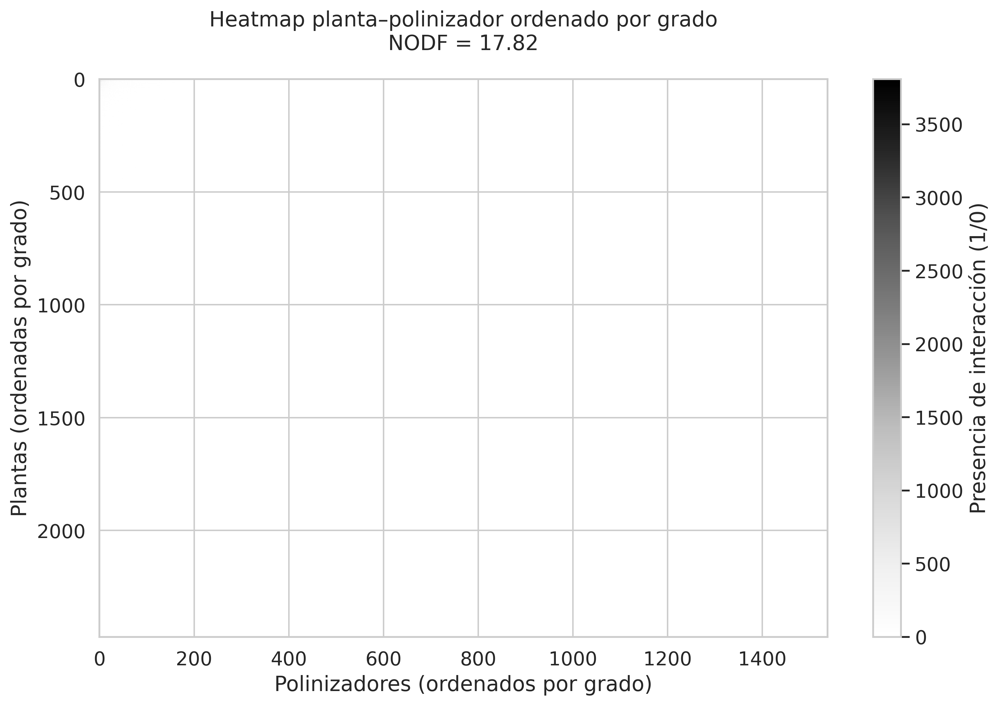

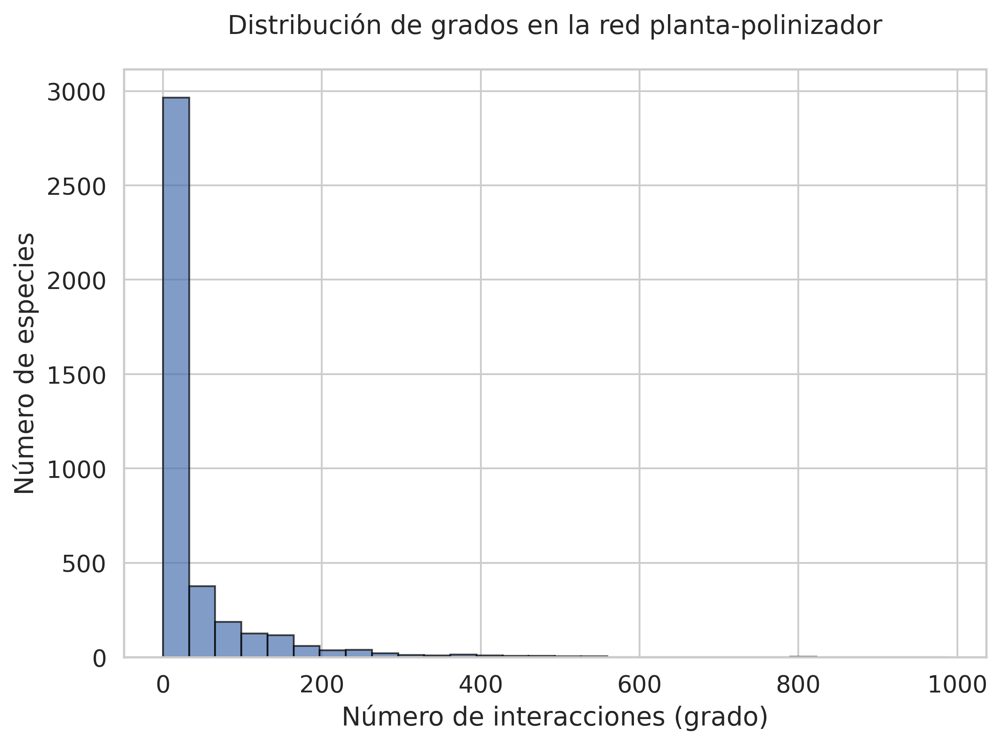

 Histograma guardado en:
C:\Users\diego\histograma_grados.png
✅ Figura B (comunidades) guardada en: C:\Users\diego\fig_grafo_comunidades.png
 Generando subred con Top 10 plantas y polinizadores...
 Subred Top 20 exportada para Gephi en:
C:\Users\diego\subred_top20.graphml

 GENERANDO VISUALIZACIÓN...

 Gráfico guardado en:
C:\Users\diego\red_polinizacion_mejorada.png


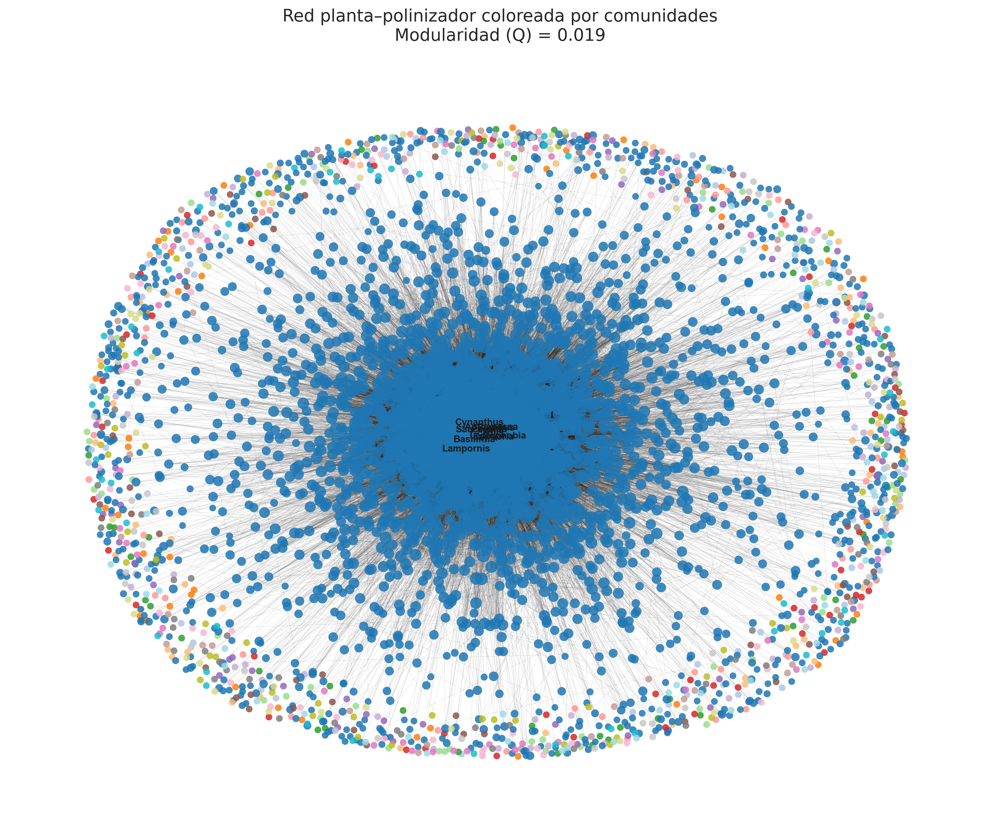

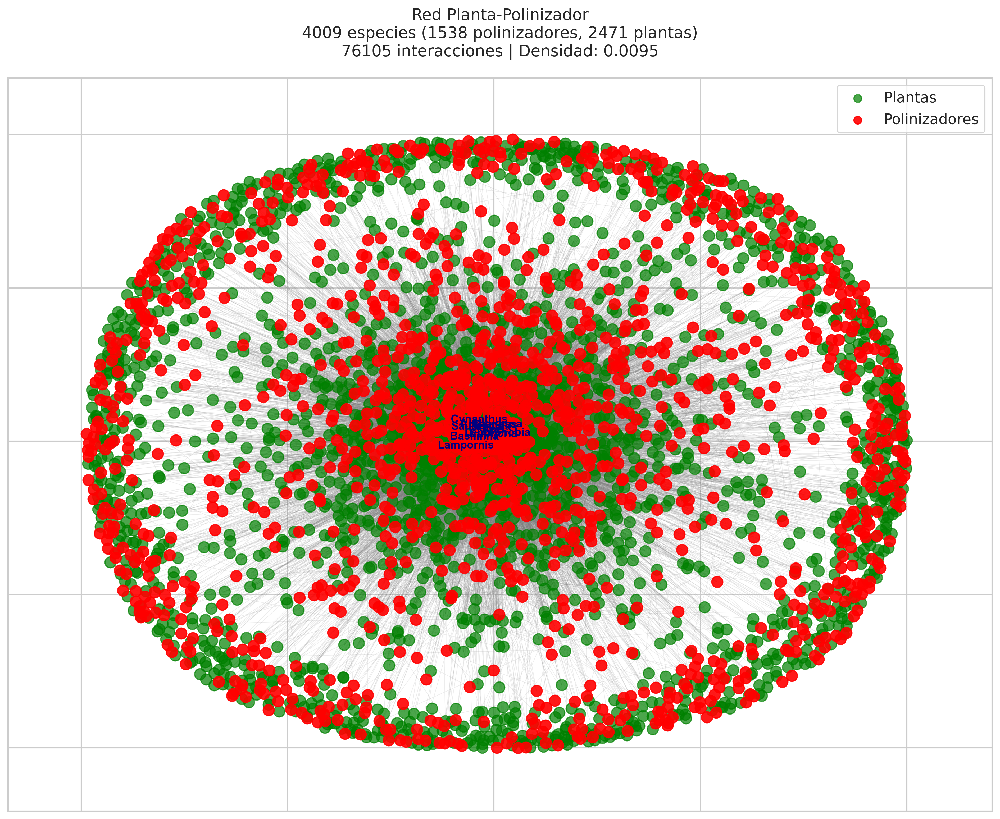


 Red exportada para Gephi en:
C:\Users\diego\red_ecologica_completa.graphml


In [10]:
# =============================================================================
# Se ejecuta la red y se visulizan los resultados 
# =============================================================================
if __name__ == "__main__":
    print("="*60)
    print("ANÁLISIS DE RED ECOLOGICA POLINIZADOR-PLANTA - DIEGO BECERRIL")
    print("="*60)
    
    #  Carga de datos
    print("\n CARGANDO DATOS...")
    raw_pol, raw_pla = cargar_datos()
    if raw_pol is None or raw_pla is None:
        exit()
    
    #  Limpieza de los datos 
    print("\n LIMPIEZA DE DATOS...")
    df_pol, df_pla = limpiar_datos(raw_pol, raw_pla)
    
    # Verificamos los datos
    if len(df_pol) == 0 or len(df_pla) == 0:
        print("\n No hay datos suficientes después de la limpieza. Abortando.")
        exit()
    
    # Construcción de la red
    print("\n" + "="*50)
    print(" PASO 3: CONSTRUYENDO LA RED ECOLOGICA")
    print("="*50)
    G = construir_red(df_pol, df_pla)
    
    if G is None or G.number_of_nodes() == 0:
        print("\n No se pudo construir la red")
        exit()
    
    # Análisis de la red 
    print("\n RESULTADOS DEL ANÁLISIS:")
    metricas = analizar_red(G)
    if metricas:
        for k, v in metricas.items():
            if k == 'top_polinizadores':
                print(f"- Top 10 polinizadores por grado: {[f'{n} ({d}, {sec})' for n, d, sec in v]}")
            elif k == 'top_plantas':
                print(f"- Top 10 plantas por grado: {[f'{n} ({d}, {sec})' for n, d, sec in v]}")
            elif k in ['nodos_componente_mas_grande', 'aristas_componente_mas_grande']:
                print(f"- {k.replace('_', ' ').title()}: {v}")
            else:
                print(f"- {k.replace('_', ' ').title()}: {v}")



# ==================================================
    # CÁLCULO DE ANIDAMIENTO (NODF) Y MODULARIDAD
# ==================================================
    from networkx.algorithms import community
    
    def nodf(biadj_matrix):
        """Cálculo simplificado del índice NODF (Nestedness metric based on Overlap and Decreasing Fill)."""
        n_rows, n_cols = biadj_matrix.shape
        nodf_rows, nodf_cols = 0, 0
        pairs_rows, pairs_cols = 0, 0
        
        # Comparación entre pares de filas (plantas)
        for i in range(n_rows):
            for j in range(i+1, n_rows):
                ki, kj = biadj_matrix[i].sum(), biadj_matrix[j].sum()
                if ki != kj and min(ki, kj) > 0:
                    overlap = np.logical_and(biadj_matrix[i], biadj_matrix[j]).sum()
                    nodf_rows += overlap / min(ki, kj)
                    pairs_rows += 1
        
        # Comparación entre pares de columnas (polinizadores)
        for i in range(n_cols):
            for j in range(i+1, n_cols):
                ki, kj = biadj_matrix[:,i].sum(), biadj_matrix[:,j].sum()
                if ki != kj and min(ki, kj) > 0:
                    overlap = np.logical_and(biadj_matrix[:,i], biadj_matrix[:,j]).sum()
                    nodf_cols += overlap / min(ki, kj)
                    pairs_cols += 1
        
        nodf_score = 100 * (nodf_rows + nodf_cols) / (pairs_rows + pairs_cols)
        return nodf_score
    
    # Convierte el grafo bipartito en matriz de adyacencia
    nodes_plants = [n for n, d in G.nodes(data=True) if d["tipo"] == "planta"]
    nodes_pollinators = [n for n, d in G.nodes(data=True) if d["tipo"] == "polinizador"]
    
    biadj_matrix = nx.bipartite.biadjacency_matrix(
        G, row_order=nodes_plants, column_order=nodes_pollinators
    ).toarray()
    
    nodf_value = nodf(biadj_matrix)
    print(f"- NODF (Anidamiento) = {nodf_value:.2f}")
    
    # Cálculo de modularidad
    comunidades = community.greedy_modularity_communities(G)
    modularidad = community.modularity(G, comunidades)
    print(f"- Modularidad = {modularidad:.3f}")    

    # ==================================================
    # FIGURA A: HEATMAP DE LA MATRIZ (ANIDAMIENTO)
    # ==================================================
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Ordenamos filas (plantas) y columnas (polinizadores) por su grado (suma de 1s)
    grados_filas = biadj_matrix.sum(axis=1)         # grado por planta
    grados_cols  = biadj_matrix.sum(axis=0)         # grado por polinizador

    idx_rows = np.argsort(-grados_filas)            # orden descendente
    idx_cols = np.argsort(-grados_cols)

    matriz_ord = biadj_matrix[idx_rows][:, idx_cols]

    # 2) Graficamos heatmap con matplotlib (sin seaborn)
    plt.figure(figsize=(10, 7))
    plt.imshow(matriz_ord, aspect='auto', interpolation='nearest', cmap='Greys')
    plt.colorbar(label='Presencia de interacción (1/0)')
    plt.xlabel('Polinizadores (ordenados por grado)')
    plt.ylabel('Plantas (ordenadas por grado)')
    plt.title(f'Heatmap planta–polinizador ordenado por grado\nNODF = {nodf_value:.2f}')
    plt.tight_layout()

    # 3) Guardar imagen
    fig_heatmap_path = 'fig_heatmap_anidamiento.png'
    plt.savefig(fig_heatmap_path, dpi=300, bbox_inches='tight')
    print(f"✅ Figura A (heatmap) guardada en: {os.path.abspath(fig_heatmap_path)}")

# ================================================
# Histograma de distribución de grados
# ================================================
    print("Generando histograma de distribución de grados...")

    grados = dict(G.degree())
    df_grados = pd.DataFrame(list(grados.items()), columns=["Especie", "Grado"])

    plt.figure(figsize=(8,6))
    plt.hist(df_grados["Grado"], bins=30, edgecolor="black", alpha=0.7)
    plt.xlabel("Número de interacciones (grado)")
    plt.ylabel("Número de especies")
    plt.title("Distribución de grados en la red planta-polinizador")
    plt.tight_layout()
    
    # Guardamos la figura en archivo
    ruta_hist = "histograma_grados.png"
    plt.savefig(ruta_hist, dpi=300)
    plt.show()

    print(f" Histograma guardado en:\n{os.path.abspath(ruta_hist)}")


    # 1) Creamos un dict de comunidad por nodo
    comunidad_por_nodo = {}
    for i, cset in enumerate(comunidades):
        for n in cset:
            comunidad_por_nodo[n] = i

    # 2) Paleta simple y repetible
    colores = plt.cm.tab20(np.linspace(0, 1, max(20, len(comunidades))))
    color_map = [colores[comunidad_por_nodo[n] % len(colores)] for n in G.nodes()]

    # 3) Tamaño de nodos proporcional al grado (log para mejor rango)
    grados = dict(G.degree())
    sizes = [max(30, np.log1p(grados[n]) * 30) for n in G.nodes()]

    # 4) Layout (rápido y reproducible); para la versión final puedes usar ForceAtlas2 en Gephi
    pos = nx.spring_layout(G, seed=42, k=0.3, iterations=50)

    # 5) Dibujo
    plt.figure(figsize=(12, 10))
    nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=sizes, alpha=0.85, linewidths=0.2)
    nx.draw_networkx_edges(G, pos, width=0.2, alpha=0.2)

    # (Opcional) Etiquetar las 10 especies más conectadas
    top_n = 10
    top_nodes = sorted(grados.items(), key=lambda x: x[1], reverse=True)[:top_n]
    labels = {n: n.split(' ')[0] for n, _ in top_nodes}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, font_weight='bold')

    plt.title(f"Red planta–polinizador coloreada por comunidades\nModularidad (Q) = {modularidad:.3f}")
    plt.axis('off')
    plt.tight_layout()

    # 6) Guardar imagen
    fig_comms_path = 'fig_grafo_comunidades.png'
    plt.savefig(fig_comms_path, dpi=300, bbox_inches='tight')
    print(f"✅ Figura B (comunidades) guardada en: {os.path.abspath(fig_comms_path)}")


    #Subred de mi top 10 
    print(" Generando subred con Top 10 plantas y polinizadores...")
    top_pol = [n for n, _, _ in metricas['top_polinizadores']]
    top_pla = [n for n, _, _ in metricas['top_plantas']]
    nodos_top20 = set(top_pol + top_pla)
    G_sub = G.subgraph(nodos_top20).copy()

    ruta_sub = "subred_top20.graphml"
    nx.write_graphml(G_sub, ruta_sub)
    print(f" Subred Top 20 exportada para Gephi en:\n{os.path.abspath(ruta_sub)}")
    
    # Visualización en gephi para obtener un mejor manejo de los datos 
    
    print("\n GENERANDO VISUALIZACIÓN...")
    visualizar_red(G, top_n=10)
    
    # 6. Exportación para Gephi
    ruta_gephi = "red_ecologica_completa.graphml"
    nx.write_graphml(G, ruta_gephi)
    print(f"\n Red exportada para Gephi en:\n{os.path.abspath(ruta_gephi)}")